# Detecting Red Blood Cells (RBC), White Blood Cells(WBC) and Platelets in Blood Cells Images 

## 1. Introduction

**Red Blood Cells (RBCs), White Blood Cells (WBCs), and Platelets** are critical components of blood, each with specific roles in maintaining health and diagnosing various diseases:

1. **Red Blood Cells (RBCs)**: 
   - **Function**: RBCs, also known as erythrocytes, are responsible for carrying oxygen from the lungs to the rest of the body and returning carbon dioxide back to the lungs for exhalation. They contain hemoglobin, a protein that binds oxygen.
   - **Associated Diseases**: 
     - **Anemia**: A condition characterized by a deficiency of RBCs or hemoglobin, leading to fatigue, weakness, and shortness of breath.
     - **Polycythemia**: An abnormal increase in RBCs, which can cause blood clots, leading to heart attacks or strokes.

   **[Mayo Clinic - Red Blood Cells](https://www.mayoclinic.org/tests-procedures/complete-blood-count/about/pac-20384919)**

2. **White Blood Cells (WBCs)**:
   - **Function**: WBCs, or leukocytes, are part of the immune system and are crucial for fighting infections, attacking foreign bodies, and protecting against disease.
   - **Associated Diseases**:
     - **Leukemia**: A type of cancer where there is an abnormal increase in WBCs, leading to the disruption of normal blood cell production.
     - **Leukopenia**: A decrease in WBC count, which weakens the immune system and increases susceptibility to infections.

   **[NIH - White Blood Cells](https://www.ncbi.nlm.nih.gov/books/NBK2263/)**

3. **Platelets**:
   - **Function**: Platelets, or thrombocytes, are involved in blood clotting. They gather at the site of a blood vessel injury, stick to the lining of the injured vessel, and form a platform for blood coagulation.
   - **Associated Diseases**:
     - **Thrombocytopenia**: A condition characterized by a low platelet count, leading to excessive bleeding and bruising.
     - **Thrombocythemia**: An abnormally high platelet count, which can cause blood clots, increasing the risk of stroke or heart attack.

   **[Johns Hopkins - Platelets](https://www.hopkinsmedicine.org/health/conditions-and-diseases/thrombocytopenia-low-platelet-count)**

### **Detection and Diagnosis**: 

By analyzing the levels and morphology of RBCs, WBCs, and platelets, medical professionals can diagnose a wide range of conditions, from infections and immune disorders to blood cancers and clotting disorders. Automated detection using deep learning improves the accuracy and efficiency of these diagnostics, helping to identify these conditions early and accurately.


The detection of red blood cells (RBCs), white blood cells (WBCs), and platelets using **deep learning** is crucial in biomedical diagnostics for several key reasons:

1. **Accuracy in Diagnosis**: Manual analysis of blood cells can be error-prone due to observer fatigue or subjectivity. Deep learning algorithms, trained on large datasets, can identify and classify cells with high accuracy, reducing the risk of incorrect diagnoses.

2. **Speed of Results**: The automated processing of images and detection of cells using deep learning is significantly faster than traditional methods. This allows for quicker results, which is critical in medical emergencies.

3. **Early Disease Detection**: Deep learning can detect subtle abnormalities in blood cells that may indicate diseases such as leukemia, anemia, and other hematological disorders at early stages, enabling timely treatment.

4. **Cost Reduction**: Automation of blood analysis through deep learning reduces the need for human intervention, potentially lowering the costs associated with laboratory tests and allowing more patients to access high-quality diagnostic services.

5. **Scalability and Accessibility**: Deep learning-based systems can be deployed in multiple locations and are scalable, enabling laboratories in remote or resource-limited areas to perform blood analysis with the same accuracy as advanced healthcare centers.

**References:**

- A study published in *Nature* highlights the use of deep learning for blood cell detection, emphasizing its accuracy and efficiency compared to traditional methods ([Nature](https://www.nature.com/articles/s41598-020-71180-0)).

- The *American Society of Hematology* discusses how artificial intelligence, particularly deep learning, is transforming the diagnosis of hematological diseases through image analysis ([ASH](https://www.hematology.org/education/trainees/fellows/career-planning/ai-in-hematology)).

- An article from *IEEE* explores how deep learning models are being trained to identify RBCs, WBCs, and platelets with accuracy comparable to human experts, improving the diagnosis of blood-related diseases ([IEEE](https://ieeexplore.ieee.org/document/9139050)).

## 2. **Setting up our workspace**

---
**Display Basic GPU Information**

---

In [1]:
!nvidia-smi

Tue Jul 23 10:33:34 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

---
**Set`/content` as HOME  and `/content/datasets` as dataset_dir**

---

In [2]:
import os
HOME = os.getcwd()
print(HOME)


/content


---
**Mount google drive** (if you want save something in it)

---

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


---
**Install roboflow and ultralytics libraries** (1m 30s)

---

In [4]:
%%time

# Pip install method (recommended)

!pip install --upgrade pip
!pip install -q torch torchvision torchaudio
!pip install -q roboflow
!pip install -q ultralytics #==8.0.196

Ultralytics YOLOv8.2.63 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 31.9/78.2 GB disk)


---
**Check ultralytics installation**

---

In [ ]:
# check package y hardware
import ultralytics
ultralytics.checks()

---
**Load YOLO models library**

---

In [5]:
from ultralytics import YOLO

---
**Create dataset directory**

---

Create the [dataset](https://docs.ultralytics.com/datasets/detect/) directory (if it doesn't exist), where we are going to save the dataset with which we are going to train YOLOv8.

In [6]:
import os
datasets_dir = os.path.join(HOME, "datasets")
os.makedirs(datasets_dir, exist_ok=True)
print(os.getcwd())

---
**Download yolo-yejbs dataset**

---

Our dataset is from [yolo-yejbs](https://universe.roboflow.com/tfg-2nmge/yolo-yejbs/dataset/1#)

In [7]:
# Change diretory to datasets_dir
os.chdir(datasets_dir)
print('datasets_dir =', os.getcwd())


# Dataset import (snipet from roboflow)
from roboflow import Roboflow
rf = Roboflow(api_key="5xvhWbT7GJjHZvn6ukFk")
project = rf.workspace("tfg-2nmge").project("yolo-yejbs")
version = project.version(1)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.63, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to YOLO-1 in yolov8:: 100%|██████████| 3982/3982 [00:00<00:00, 9675.78it/s] 


---
**Change to HOME**

---

In [ ]:
# Change to created directory
os.chdir(HOME)
print('dir =', os.getcwd())

dir = /content


---
**List dataset directory**

---

In [9]:
# Install pip Tree globally

!sudo apt install tree -q

!tree --dirsfirst -L 2  "YOLO-1"

Reading package lists...
Building dependency tree...
Reading state information...
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.
YOLO-1
├── test
│   ├── images
│   └── labels
├── train
│   ├── images
│   └── labels
├── valid
│   ├── images
│   └── labels
├── data.yaml
├── README.dataset.txt
└── README.roboflow.txt

9 directories, 3 files


---
**Change valid for val**

---

In [ ]:
%cd datasets/YOLO-1
!mv valid val
%cd /content
print(os.getcwd())

/content/datasets/chest-xray-image_s-1
/content
/content


---
**Variable `dataset.location` stores the address**

---

In [ ]:
# IMPORTANT: the variable dataset.location stores the address where
# the Roboflow dataset has been saved.
print(dataset.location)

/content/datasets/chest-xray-image_s-1
mv: cannot stat 'valid': No such file or directory
/content
/content
/content/datasets/chest-xray-image_s-1


## 3. **Displaying some samples from the Dataset**


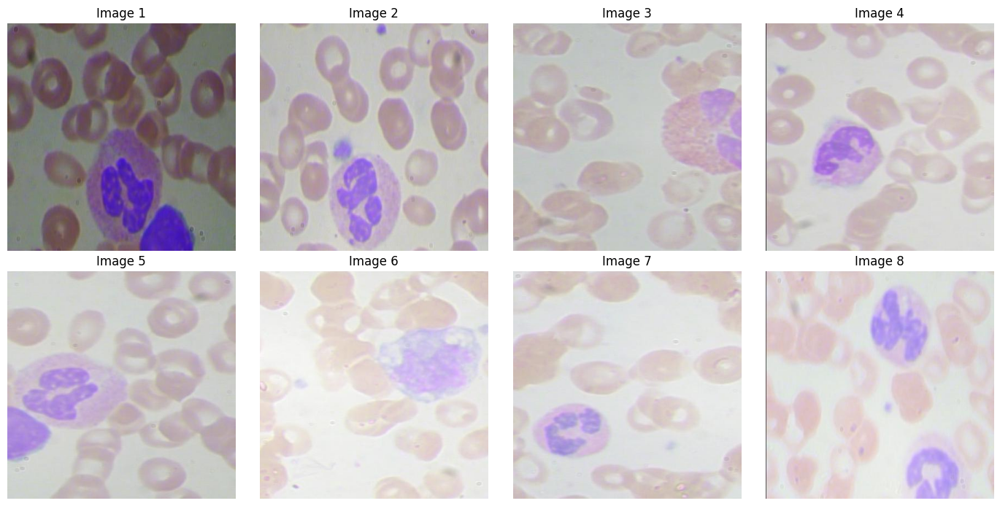

In [10]:
import matplotlib.pyplot as plt
import glob
import matplotlib.image as mpimg

# Directory of the images
image_directory = f'{dataset.location}/test/images/'

# List of image paths
image_paths = glob.glob(image_directory + '*.jpg')[:8]

# Set up the figure with subplots
fig, axs = plt.subplots(2, 4, figsize=(14, 7))

# Iterate through the images and display them in the subplots
for i, image_path in enumerate(image_paths):
    row = i // 4
    col = i % 4
    img = mpimg.imread(image_path)
    axs[row, col].imshow(img)
    axs[row, col].set_title(f'Image {i + 1}')
    axs[row, col].axis('off')

# Adjust the layout of the subplots
plt.tight_layout()
plt.show()

---
**Visualize annotations**

___

To visualize a random TXT file located in the `yolo-1/test/labels`

In [12]:
import os
import random

# Path to the directory containing the TXT files
directory = f'{dataset.location}/test/labels'

# List all files in the directory
files = os.listdir(directory)

# Filter only the .txt files
txt_files = [file for file in files if file.endswith('.txt')]

# Check if there are any .txt files in the directory
if not txt_files:
    print("There are no TXT files in the directory.")
else:
    # Select a random file
    random_file = random.choice(txt_files)
    file_path = os.path.join(directory, random_file)

    # Read and display the content of the selected file
    with open(file_path, 'r') as file:
        content = file.read()
        print(f"Content of the file {random_file}:")
        print(content)


Content of the file BloodImage_00367_jpg.rf.bacb4569dade7ca6797c3671d6ebaab2.txt:
1 0.5012019230769231 0.8846153846153846 0.17307692307692307 0.22596153846153846
1 0.6754807692307693 0.8617788461538461 0.1778846153846154 0.2091346153846154
1 0.5216346153846154 0.2091346153846154 0.18509615384615385 0.22596153846153846
1 0.6947115384615384 0.12980769230769232 0.1971153846153846 0.2548076923076923
1 0.5300480769230769 0.6550480769230769 0.19230769230769232 0.21153846153846154
1 0.37740384615384615 0.07572115384615384 0.20192307692307693 0.1466346153846154
1 0.5877403846153846 0.4651442307692308 0.14182692307692307 0.23557692307692307
1 0.9170673076923077 0.09615384615384616 0.16105769230769232 0.1875
1 0.7235576923076923 0.3954326923076923 0.17548076923076922 0.24278846153846154
1 0.7572115384615384 0.6358173076923077 0.17307692307692307 0.21875
1 0.22355769230769232 0.18389423076923078 0.17307692307692307 0.24278846153846154
1 0.8894230769230769 0.36177884615384615 0.16105769230769232 0

## 4. **Training with ULTRALYTICS YOLOv8**

Modify data.yaml to remove 'YOLO-1' from the train and valid paths.

---
**Training the dataset**

---

In [14]:
# Go to HOME 
os.chdir(HOME)
print(os.getcwd())

# Start training. If ".pt" does not exist in the current directory, it will be downloaded.
model = YOLO("yolov8n.pt")  # load a pretrained model (recommended for training)

# Train the model
detection_train = model.train(data=f'{dataset.location}/data.yaml', epochs=100, imgsz=640)

Ultralytics YOLOv8.2.63 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/YOLO-1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show

100%|██████████| 755k/755k [00:02<00:00, 282kB/s]


Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

train: Scanning /content/YOLO-1/train/labels... 1723 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1723/1723 [00:00<00:00, 1795.29it/s]

train: New cache created: /content/YOLO-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /content/YOLO-1/valid/labels... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<00:00, 559.34it/s]

val: New cache created: /content/YOLO-1/valid/labels.cache


Plotting labels to runs/detect/train2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train2
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.08G      1.369      1.895      1.459        216        640: 100%|██████████| 108/108 [00:47<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.83it/s]

                   all        175       2301      0.806       0.68       0.84       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       2.6G      1.213      1.097       1.32        235        640: 100%|██████████| 108/108 [00:37<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.88it/s]


                   all        175       2301      0.815      0.863      0.882      0.579

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100       2.7G        1.2      1.005      1.284        222        640: 100%|██████████| 108/108 [00:38<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.11it/s]


                   all        175       2301       0.81      0.899      0.895       0.58

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.49G      1.184     0.9777      1.272        232        640: 100%|██████████| 108/108 [00:36<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.02it/s]

                   all        175       2301      0.786      0.897      0.908      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100       2.7G      1.181     0.9325       1.26        215        640: 100%|██████████| 108/108 [00:41<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.82it/s]

                   all        175       2301      0.824      0.878      0.903      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.62G      1.159     0.8989      1.238        218        640: 100%|██████████| 108/108 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]

                   all        175       2301      0.811      0.877      0.891      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.65G      1.153     0.8811      1.246        252        640: 100%|██████████| 108/108 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.82it/s]

                   all        175       2301      0.828      0.912       0.91      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.44G      1.134     0.8546      1.229        211        640: 100%|██████████| 108/108 [00:34<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.72it/s]

                   all        175       2301      0.806      0.917      0.904      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.55G      1.133      0.844      1.227        275        640: 100%|██████████| 108/108 [00:34<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.71it/s]

                   all        175       2301      0.854      0.878      0.912      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.49G      1.125     0.8354      1.217        229        640: 100%|██████████| 108/108 [00:34<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.71it/s]

                   all        175       2301      0.828       0.91      0.917      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.87G      1.133     0.8349      1.223        198        640: 100%|██████████| 108/108 [00:42<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.77it/s]


                   all        175       2301      0.787      0.942       0.91      0.617

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.46G      1.124     0.8205      1.223        218        640: 100%|██████████| 108/108 [00:35<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]

                   all        175       2301      0.828      0.884      0.911      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.49G      1.107     0.8118      1.209        266        640: 100%|██████████| 108/108 [00:35<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.88it/s]

                   all        175       2301      0.839      0.869      0.908      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.57G      1.111     0.8045      1.216        215        640: 100%|██████████| 108/108 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.63it/s]

                   all        175       2301      0.848      0.914      0.924       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.53G      1.108     0.7983      1.209        226        640: 100%|██████████| 108/108 [00:35<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.70it/s]

                   all        175       2301       0.85      0.875      0.909      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.54G        1.1     0.7908      1.206        203        640: 100%|██████████| 108/108 [00:34<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.65it/s]

                   all        175       2301      0.851      0.915      0.924      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.54G      1.087     0.7803        1.2        214        640: 100%|██████████| 108/108 [00:40<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.16it/s]

                   all        175       2301      0.843      0.919      0.913      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.54G      1.086     0.7717      1.196        166        640: 100%|██████████| 108/108 [00:35<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.33it/s]


                   all        175       2301      0.848      0.899       0.91      0.604

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.52G      1.075     0.7623      1.195        241        640: 100%|██████████| 108/108 [00:36<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.03it/s]


                   all        175       2301      0.857      0.899      0.917      0.635

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.44G       1.08     0.7623      1.201        267        640: 100%|██████████| 108/108 [00:36<00:00,  3.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.67it/s]

                   all        175       2301      0.861      0.897      0.926      0.636



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.37G      1.074     0.7533      1.191        197        640: 100%|██████████| 108/108 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.51it/s]

                   all        175       2301       0.85      0.907      0.923      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.37G      1.074     0.7473      1.188        245        640: 100%|██████████| 108/108 [00:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        175       2301      0.845      0.879      0.924      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.32G      1.069     0.7387      1.191        236        640: 100%|██████████| 108/108 [00:37<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.76it/s]

                   all        175       2301      0.849      0.908      0.919      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.79G      1.062     0.7423      1.193        179        640: 100%|██████████| 108/108 [00:34<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.77it/s]


                   all        175       2301      0.843      0.922      0.928      0.643

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.41G      1.055     0.7364       1.18        279        640: 100%|██████████| 108/108 [00:35<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.83it/s]

                   all        175       2301      0.868      0.894      0.926      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.66G       1.05     0.7306      1.174        155        640: 100%|██████████| 108/108 [00:34<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.78it/s]

                   all        175       2301      0.868      0.894      0.933      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       2.6G      1.052     0.7306      1.177        244        640: 100%|██████████| 108/108 [00:35<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.78it/s]

                   all        175       2301      0.868      0.888      0.927      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.54G      1.055     0.7316      1.179        226        640: 100%|██████████| 108/108 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.87it/s]

                   all        175       2301      0.836      0.921      0.922      0.633



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.83G      1.052     0.7213      1.175        311        640: 100%|██████████| 108/108 [00:39<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.38it/s]

                   all        175       2301       0.85      0.899      0.925      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.41G      1.052     0.7192      1.174        281        640: 100%|██████████| 108/108 [00:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.48it/s]

                   all        175       2301      0.861      0.917      0.934      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.65G      1.034     0.7104      1.171        206        640: 100%|██████████| 108/108 [00:36<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        175       2301      0.852      0.922      0.929       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.39G      1.039     0.7022      1.172        239        640: 100%|██████████| 108/108 [00:36<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.81it/s]

                   all        175       2301      0.851       0.91      0.926      0.652



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.52G      1.034     0.6979      1.173        297        640: 100%|██████████| 108/108 [00:36<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.73it/s]

                   all        175       2301      0.859      0.904      0.931      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.59G      1.022     0.6944       1.16        167        640: 100%|██████████| 108/108 [00:38<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.67it/s]

                   all        175       2301      0.853       0.89      0.924       0.65



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.35G      1.025     0.6973      1.165        262        640: 100%|██████████| 108/108 [00:36<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.81it/s]

                   all        175       2301      0.842      0.918      0.924      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.69G      1.017     0.6802      1.159        198        640: 100%|██████████| 108/108 [00:36<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.75it/s]

                   all        175       2301      0.869       0.91      0.931      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.46G      1.013     0.6829      1.155        217        640: 100%|██████████| 108/108 [00:37<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        175       2301      0.866      0.924      0.933      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       2.6G      1.016      0.681      1.158        241        640: 100%|██████████| 108/108 [00:37<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.14it/s]


                   all        175       2301      0.857      0.911      0.929      0.649

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.53G      1.007     0.6761      1.153        153        640: 100%|██████████| 108/108 [00:37<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]


                   all        175       2301      0.863      0.913      0.943      0.673

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.65G      1.012     0.6743      1.154        284        640: 100%|██████████| 108/108 [00:40<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.11it/s]

                   all        175       2301      0.864      0.909      0.935      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.32G      1.006     0.6643      1.152        267        640: 100%|██████████| 108/108 [00:37<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]

                   all        175       2301      0.869      0.915      0.937      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.41G     0.9974     0.6657       1.15        188        640: 100%|██████████| 108/108 [00:37<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.19it/s]


                   all        175       2301      0.872       0.91      0.935      0.658

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.57G     0.9993     0.6703       1.15        259        640: 100%|██████████| 108/108 [00:35<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.15it/s]


                   all        175       2301      0.876      0.917      0.942      0.669

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.54G     0.9825     0.6532      1.141        194        640: 100%|██████████| 108/108 [00:37<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.06it/s]

                   all        175       2301      0.871       0.91      0.931      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.69G     0.9866     0.6533      1.141        188        640: 100%|██████████| 108/108 [00:37<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.20it/s]

                   all        175       2301      0.859      0.893      0.926      0.647



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.77G     0.9712     0.6388      1.135        239        640: 100%|██████████| 108/108 [00:40<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.28it/s]


                   all        175       2301      0.891      0.887      0.939      0.662

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.57G      0.983     0.6499      1.142        220        640: 100%|██████████| 108/108 [00:37<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.37it/s]

                   all        175       2301      0.859       0.92      0.937       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.64G     0.9741     0.6476      1.139        305        640: 100%|██████████| 108/108 [00:37<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.16it/s]

                   all        175       2301      0.866      0.909      0.935      0.653



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.57G     0.9745     0.6471      1.138        191        640: 100%|██████████| 108/108 [00:37<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.34it/s]

                   all        175       2301      0.885      0.907      0.937      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.47G     0.9641     0.6378      1.126        268        640: 100%|██████████| 108/108 [00:37<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.18it/s]

                   all        175       2301      0.859      0.934      0.937      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100       2.7G     0.9692     0.6324      1.132        292        640: 100%|██████████| 108/108 [00:38<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.58it/s]

                   all        175       2301      0.876      0.911      0.935      0.671



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.46G     0.9539     0.6236      1.124        327        640: 100%|██████████| 108/108 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.40it/s]

                   all        175       2301       0.88       0.92      0.943      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.36G     0.9647     0.6277       1.13        198        640: 100%|██████████| 108/108 [00:36<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]

                   all        175       2301      0.852      0.945      0.937      0.665



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.57G     0.9497     0.6171      1.124        193        640: 100%|██████████| 108/108 [00:38<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]


                   all        175       2301      0.877      0.937      0.949      0.685

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.69G     0.9494     0.6212      1.122        304        640: 100%|██████████| 108/108 [00:35<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.16it/s]

                   all        175       2301      0.876      0.925      0.933      0.659



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.71G     0.9479      0.614      1.116        245        640: 100%|██████████| 108/108 [00:37<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.15it/s]

                   all        175       2301      0.868      0.915      0.932      0.663



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.49G     0.9405     0.6176      1.124        208        640: 100%|██████████| 108/108 [00:40<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.36it/s]

                   all        175       2301       0.89      0.906      0.944      0.672



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.51G     0.9419     0.6049      1.115        252        640: 100%|██████████| 108/108 [00:38<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]

                   all        175       2301      0.884      0.921      0.947      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       2.6G     0.9364     0.5986      1.117        259        640: 100%|██████████| 108/108 [00:37<00:00,  2.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.22it/s]

                   all        175       2301      0.889      0.906      0.942      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.55G     0.9288      0.588      1.108        272        640: 100%|██████████| 108/108 [00:37<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.18it/s]


                   all        175       2301      0.886      0.932      0.945      0.681

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.87G     0.9229     0.5919      1.102        247        640: 100%|██████████| 108/108 [00:36<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        175       2301       0.89      0.918      0.944      0.677



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.65G       0.92     0.5937      1.107        248        640: 100%|██████████| 108/108 [00:37<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.24it/s]

                   all        175       2301        0.9      0.916      0.948      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.68G     0.9207      0.596      1.106        212        640: 100%|██████████| 108/108 [00:41<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]

                   all        175       2301      0.884      0.926      0.951      0.688



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.49G     0.9169      0.586      1.103        255        640: 100%|██████████| 108/108 [00:36<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.71it/s]

                   all        175       2301      0.888      0.935       0.95       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.51G     0.9072     0.5793      1.101        207        640: 100%|██████████| 108/108 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.17it/s]


                   all        175       2301      0.862      0.929       0.94      0.682

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.36G      0.905      0.581      1.089        205        640: 100%|██████████| 108/108 [00:37<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.48it/s]


                   all        175       2301      0.883       0.94      0.948      0.687

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.53G     0.9026     0.5771      1.089        217        640: 100%|██████████| 108/108 [00:36<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.37it/s]

                   all        175       2301      0.875      0.937      0.943       0.68



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.64G     0.9037     0.5784      1.099        171        640: 100%|██████████| 108/108 [00:39<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]

                   all        175       2301      0.875      0.939      0.941      0.675



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.36G     0.8986     0.5697      1.092        255        640: 100%|██████████| 108/108 [00:37<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.01it/s]


                   all        175       2301      0.884      0.932      0.936       0.68

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.32G     0.9007     0.5773      1.098        165        640: 100%|██████████| 108/108 [00:37<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.47it/s]

                   all        175       2301       0.88      0.912       0.94      0.678



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.62G      0.892     0.5633      1.089        199        640: 100%|██████████| 108/108 [00:36<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.40it/s]

                   all        175       2301      0.901      0.915      0.948      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       2.7G     0.8926     0.5662      1.088        257        640: 100%|██████████| 108/108 [00:35<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.61it/s]

                   all        175       2301      0.909      0.922      0.945      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100       2.5G     0.8829     0.5604      1.086        237        640: 100%|██████████| 108/108 [00:34<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.91it/s]

                   all        175       2301      0.886      0.935      0.946      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.49G     0.8876     0.5566      1.085        228        640: 100%|██████████| 108/108 [00:39<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.96it/s]

                   all        175       2301      0.886      0.936      0.946      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.44G     0.8784     0.5544       1.08        166        640: 100%|██████████| 108/108 [00:35<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.70it/s]

                   all        175       2301      0.898       0.93      0.947      0.686



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.51G     0.8727     0.5474      1.076        242        640: 100%|██████████| 108/108 [00:35<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.78it/s]

                   all        175       2301      0.902      0.929      0.949      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.32G     0.8691     0.5459      1.077        282        640: 100%|██████████| 108/108 [00:37<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.47it/s]


                   all        175       2301      0.899      0.931       0.95      0.689

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.58G     0.8735     0.5463      1.084        198        640: 100%|██████████| 108/108 [00:36<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.85it/s]

                   all        175       2301      0.908      0.906      0.944      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.49G     0.8664     0.5429      1.076        207        640: 100%|██████████| 108/108 [00:40<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.77it/s]


                   all        175       2301      0.879      0.946      0.949      0.698

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.68G     0.8681     0.5377      1.071        264        640: 100%|██████████| 108/108 [00:36<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.27it/s]

                   all        175       2301      0.893      0.938      0.947      0.692



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.71G     0.8646     0.5353      1.071        182        640: 100%|██████████| 108/108 [00:35<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.75it/s]

                   all        175       2301      0.898      0.932      0.949      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.54G     0.8568     0.5378      1.079        228        640: 100%|██████████| 108/108 [00:35<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.66it/s]

                   all        175       2301      0.903      0.936      0.944      0.693



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100       2.5G      0.853     0.5328      1.072        295        640: 100%|██████████| 108/108 [00:34<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.61it/s]

                   all        175       2301      0.904      0.938      0.948       0.69



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.52G     0.8592     0.5314      1.069        279        640: 100%|██████████| 108/108 [00:34<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.71it/s]

                   all        175       2301       0.91      0.925      0.949      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.36G     0.8466     0.5244      1.069        217        640: 100%|██████████| 108/108 [00:41<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.18it/s]

                   all        175       2301      0.901       0.93      0.946      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.45G      0.852      0.528       1.07        249        640: 100%|██████████| 108/108 [00:37<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.84it/s]

                   all        175       2301      0.902      0.937      0.946      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.63G     0.8424     0.5218      1.063        209        640: 100%|██████████| 108/108 [00:37<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.15it/s]

                   all        175       2301      0.909      0.926       0.95      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.62G     0.8407      0.523      1.065        210        640: 100%|██████████| 108/108 [00:35<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.38it/s]

                   all        175       2301      0.902      0.945      0.948      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.66G     0.8373      0.519      1.062        254        640: 100%|██████████| 108/108 [00:37<00:00,  2.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.23it/s]

                   all        175       2301      0.904      0.937       0.95      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.71G     0.8385     0.5168      1.062        250        640: 100%|██████████| 108/108 [00:40<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]

                   all        175       2301      0.907      0.933      0.949      0.696


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.61G     0.8252     0.4833      1.074        175        640: 100%|██████████| 108/108 [00:39<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        175       2301      0.901      0.939      0.952      0.697



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100       2.2G     0.7955     0.4583      1.064        149        640: 100%|██████████| 108/108 [00:35<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.18it/s]

                   all        175       2301      0.904      0.937      0.949      0.695



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.16G     0.7857     0.4527      1.057        132        640: 100%|██████████| 108/108 [00:34<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.25it/s]

                   all        175       2301      0.911      0.927      0.951      0.703



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.16G     0.7842     0.4488      1.053        142        640: 100%|██████████| 108/108 [00:34<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.43it/s]

                   all        175       2301      0.893      0.946      0.953      0.707



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.16G     0.7794     0.4445      1.051        119        640: 100%|██████████| 108/108 [00:32<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.86it/s]

                   all        175       2301        0.9      0.941      0.952      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.21G     0.7788      0.442      1.052        133        640: 100%|██████████| 108/108 [00:37<00:00,  2.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.98it/s]

                   all        175       2301      0.904      0.938      0.953       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.18G      0.775     0.4392       1.05        121        640: 100%|██████████| 108/108 [00:32<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.77it/s]

                   all        175       2301      0.893      0.949      0.953      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.16G     0.7699     0.4371      1.048        125        640: 100%|██████████| 108/108 [00:32<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.35it/s]

                   all        175       2301      0.906      0.939      0.953      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.16G     0.7658     0.4332      1.043        132        640: 100%|██████████| 108/108 [00:34<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.32it/s]

                   all        175       2301      0.907      0.937      0.952       0.71



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.18G     0.7579     0.4286      1.035        134        640: 100%|██████████| 108/108 [00:34<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.49it/s]

                   all        175       2301      0.912      0.932      0.953      0.712



100 epochs completed in 1.123 hours.
Optimizer stripped from runs/detect/train2/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/train2/weights/best.pt, 6.3MB

Validating runs/detect/train2/weights/best.pt...
Ultralytics YOLOv8.2.63 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:09<00:00,  1.60s/it]


                   all        175       2301      0.911      0.933      0.953      0.712
             Platelets         94        173      0.901      0.954      0.958      0.564
                   RBC        164       1947       0.85      0.845      0.909      0.694
                   WBC        174        181      0.983          1      0.993      0.877
Speed: 0.5ms preprocess, 3.4ms inference, 0.0ms loss, 8.0ms postprocess per image
Results saved to runs/detect/train2


---
**Results Output Console**

---

Aqui esta la explicación de lo que significa la salida.

---
**Results directory**

---

Classification_train.save_dir` is where the classification results are saved.


In [ ]:
print(detection_train.save_dir)

---
**Display training results**

---

In [ ]:
detection_train_save_dir= detection_train.save_dir

print(os.listdir(detection_train_save_dir),'\n')

!ls -la {detection_train_save_dir}

['val_batch1_labels.jpg', 'weights', 'args.yaml', 'val_batch2_labels.jpg', 'results.png', 'train_batch0.jpg', 'confusion_matrix_normalized.png', 'val_batch2_pred.jpg', 'events.out.tfevents.1723460697.fedde0a3941b.334.0', 'results.csv', 'train_batch2.jpg', 'confusion_matrix.png', 'train_batch9521.jpg', 'train_batch9520.jpg', 'val_batch0_labels.jpg', 'val_batch1_pred.jpg', 'val_batch0_pred.jpg', 'train_batch1.jpg', 'train_batch9522.jpg'] 

total 1852
drwxr-xr-x 3 root root   4096 Aug 12 11:47 .
drwxr-xr-x 3 root root   4096 Aug 12 11:04 ..
-rw-r--r-- 1 root root   1560 Aug 12 11:04 args.yaml
-rw-r--r-- 1 root root 113558 Aug 12 11:47 confusion_matrix_normalized.png
-rw-r--r-- 1 root root 102992 Aug 12 11:47 confusion_matrix.png
-rw-r--r-- 1 root root 130922 Aug 12 11:48 events.out.tfevents.1723460697.fedde0a3941b.334.0
-rw-r--r-- 1 root root   5952 Aug 12 11:47 results.csv
-rw-r--r-- 1 root root 130794 Aug 12 11:47 results.png
-rw-r--r-- 1 root root 112175 Aug 12 11:05 train_batch0.jpg
-

---
**Print results.csv**

---

In [ ]:
!cat {detection_train_save_dir}/results.csv | head -10

                  epoch,             train/loss,  metrics/accuracy_top1,  metrics/accuracy_top5,               val/loss,                 lr/pg0,                 lr/pg1,                 lr/pg2
                      1,                 0.7699,                0.78082,                      1,                0.78189,              0.0002375,              0.0002375,              0.0002375
                      2,                0.57336,                0.80548,                      1,                0.75755,             0.00045981,             0.00045981,             0.00045981
                      3,                0.53174,                0.75799,                      1,                0.78963,             0.00066641,             0.00066641,             0.00066641
                      4,                0.51135,                0.80457,                      1,                0.75239,             0.00064331,             0.00064331,             0.00064331
                      5,                

---
**Print confusion matrix and confusion matrix normalized**

---

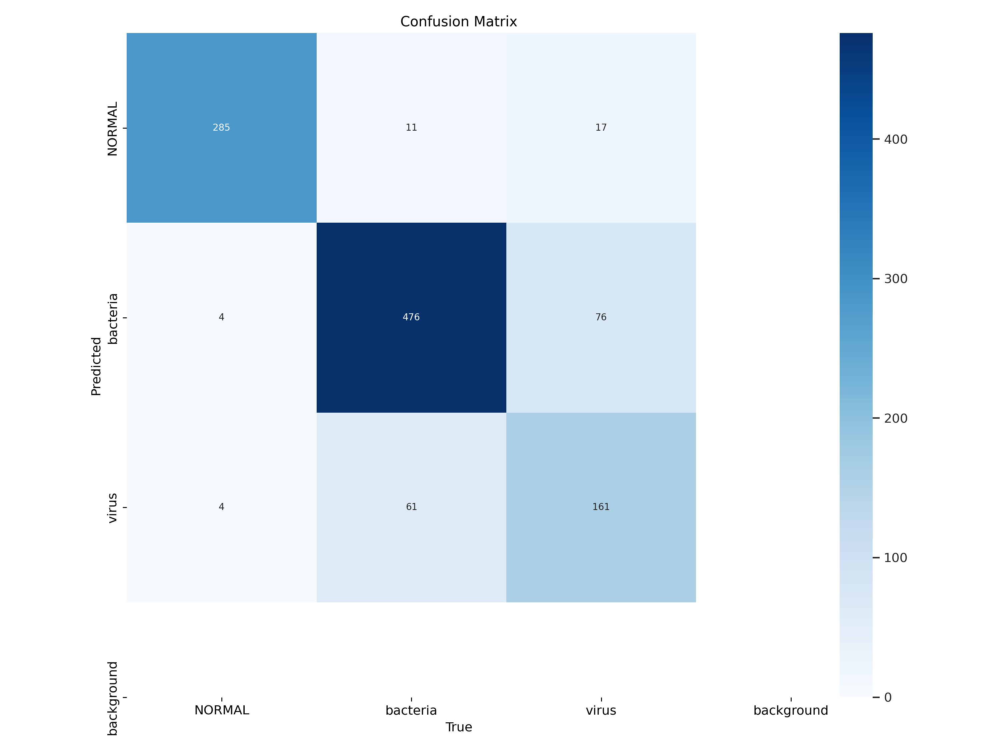

In [ ]:
from IPython.display import display, Image

Image(filename=f'{detection_train_save_dir}/confusion_matrix.png',width=800)

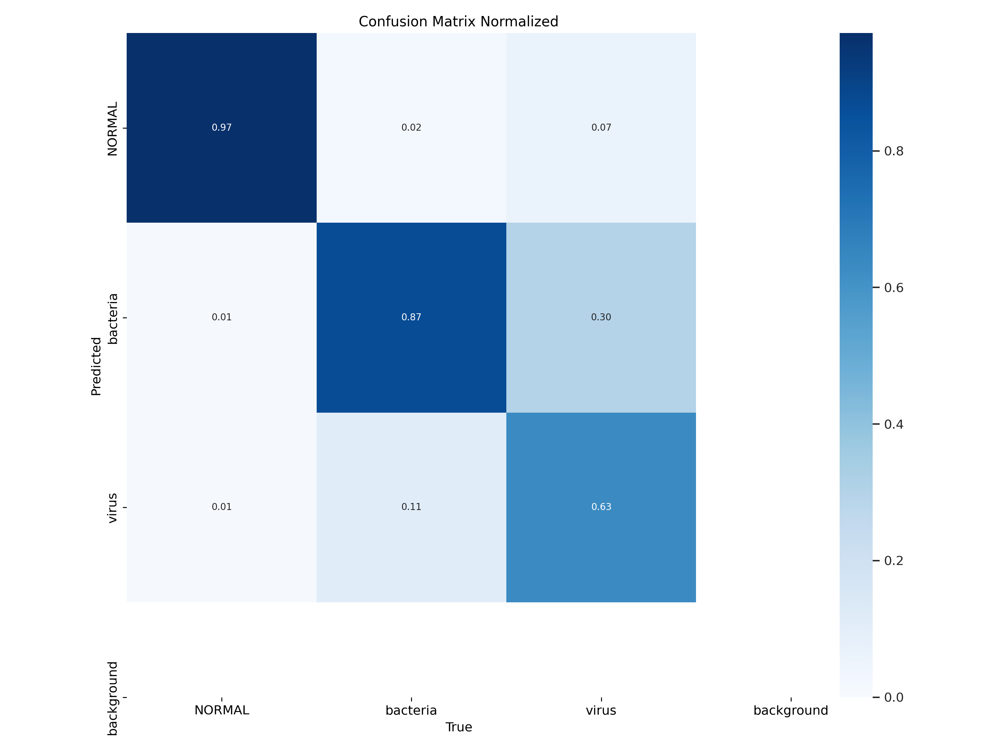

In [ ]:
Image(filename=f'{detection_train_save_dir}/confusion_matrix_normalized.png',width=800)

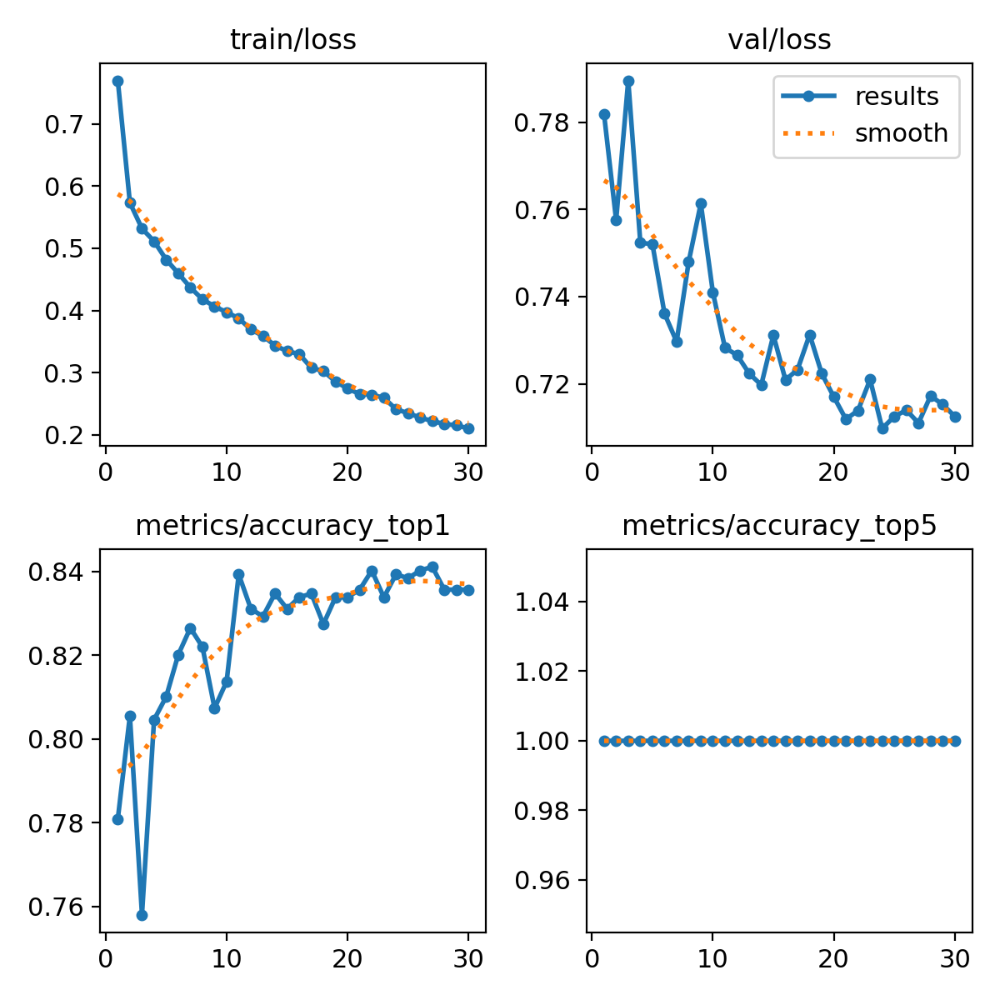

In [ ]:
Image(filename=f'{detection_train_save_dir}/results.png',width=800)

---
**Display some examples** (train_batch1)

---

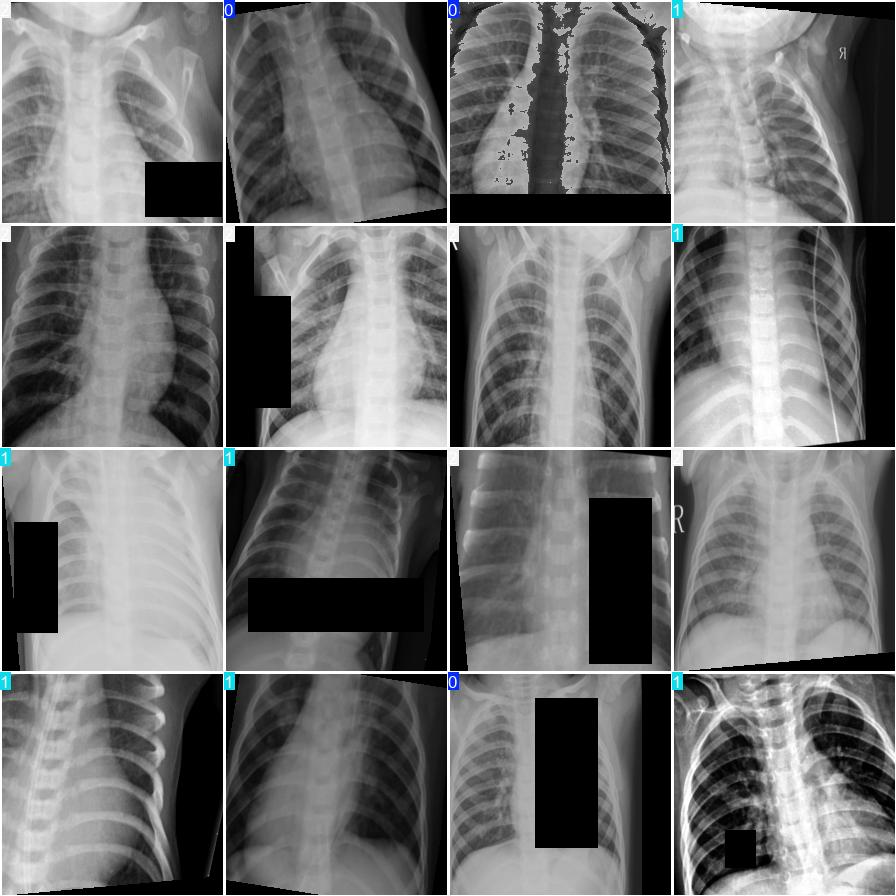

In [ ]:
Image(filename=f'{detection_train_save_dir}/train_batch1.jpg',width=800)

---
**Display some example (val_batch1 labels vs pred_batch1 labels)**

---

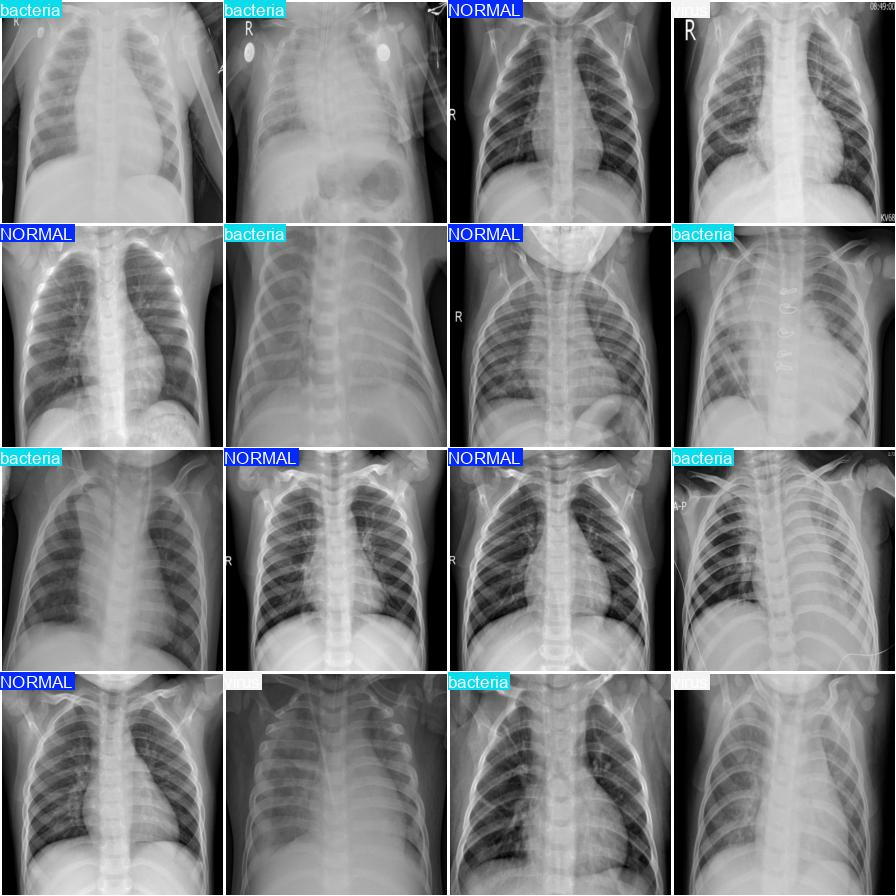

In [ ]:
Image(filename=f'{detection_train_save_dir}/val_batch1_labels.jpg',width=800)

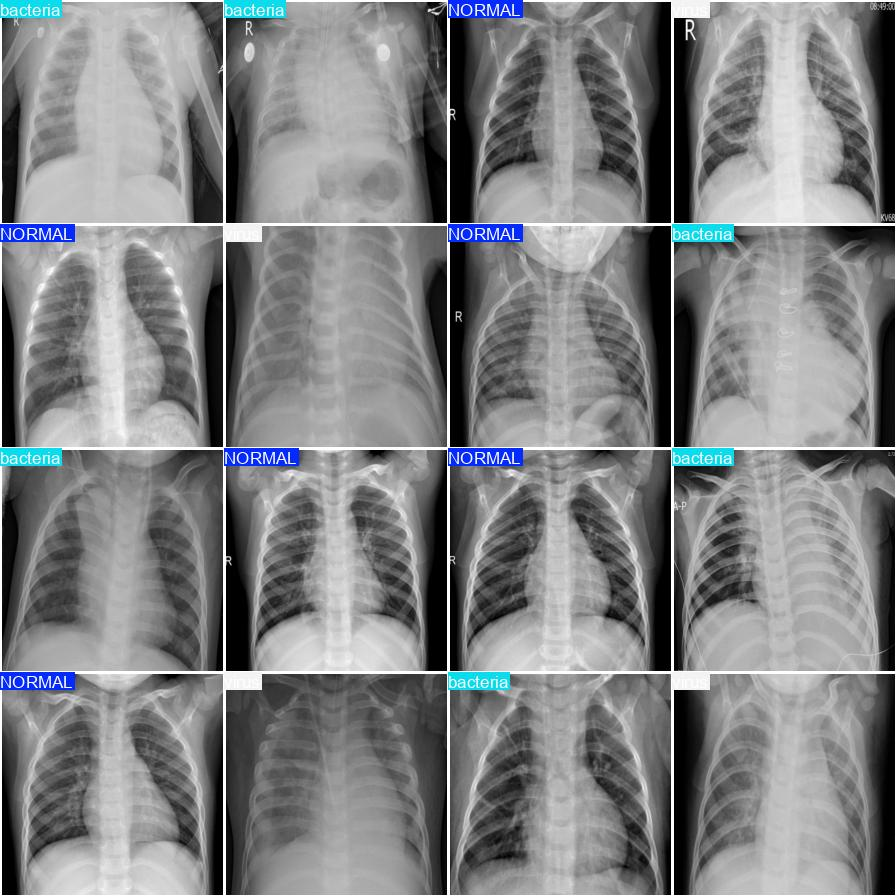

In [ ]:
Image(filename=f'{detection_train_save_dir}/val_batch1_pred.jpg',width=800)

## 5. [VALIDATING (ULTRALYTICS YOLOV8)](https://docs.ultralytics.com/modes/val/#key-features-of-val-mode)

For a complete performance evaluation, it's crucial to review all these metrics. For more details, refer to the [Key Features of Val Mode](https://docs.ultralytics.com/modes/val/#key-features-of-val-mode).

In [15]:
# Assume detection_val (metrics) is the object containing the validation results

# Validate the model. detection_val == metrics
detection_val = model.val()  # no arguments needed, dataset and settings remembered

Ultralytics YOLOv8.2.63 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3,006,233 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning /content/YOLO-1/valid/labels.cache... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:13<00:00,  1.25s/it]


                   all        175       2301      0.911      0.933      0.953      0.712
             Platelets         94        173        0.9      0.954      0.958      0.567
                   RBC        164       1947      0.849      0.846      0.909      0.694
                   WBC        174        181      0.983          1      0.993      0.875
Speed: 1.4ms preprocess, 11.6ms inference, 0.0ms loss, 9.7ms postprocess per image
Results saved to runs/detect/train22


array([    0.56699,     0.69445,     0.87548])

In [16]:
import pandas as pd




# Extract the relevant metrics
map50_95 = detection_val.box.map  # map50-95
map50 = detection_val.box.map50  # map50
map75 = detection_val.box.map75  # map75
maps = detection_val.box.maps  # a list contains map50-95 of each category

# Create a dictionary with the extracted metrics
data = {
    'map50-95': [map50_95],
    'map50': [map50],
    'map75': [map75],
}

# If you have category names, you can include them in the DataFrame
category_names = ['Platelets', 'RBC', 'WBC']  # Replace with actual category names
category_data = {name: [value] for name, value in zip(category_names, maps)}

# Combine the data
data.update(category_data)

# Create a DataFrame
df = pd.DataFrame(data)

# Print the DataFrame
print(df)


Ultralytics YOLOv8.2.63 🚀 Python-3.10.12 torch-2.3.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/YOLO-1/valid/labels.cache... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:12<00:00,  1.15s/it]


                   all        175       2301      0.911      0.933      0.953      0.712
             Platelets         94        173        0.9      0.954      0.958      0.567
                   RBC        164       1947      0.849      0.846      0.909      0.694
                   WBC        174        181      0.983          1      0.993      0.875
Speed: 1.2ms preprocess, 8.0ms inference, 0.0ms loss, 7.0ms postprocess per image
Results saved to runs/detect/train23
   map50-95     map50     map75  Platelets       RBC       WBC
0  0.712306  0.953483  0.818061   0.566986  0.694455  0.875476


---
**Print validation results** 

---

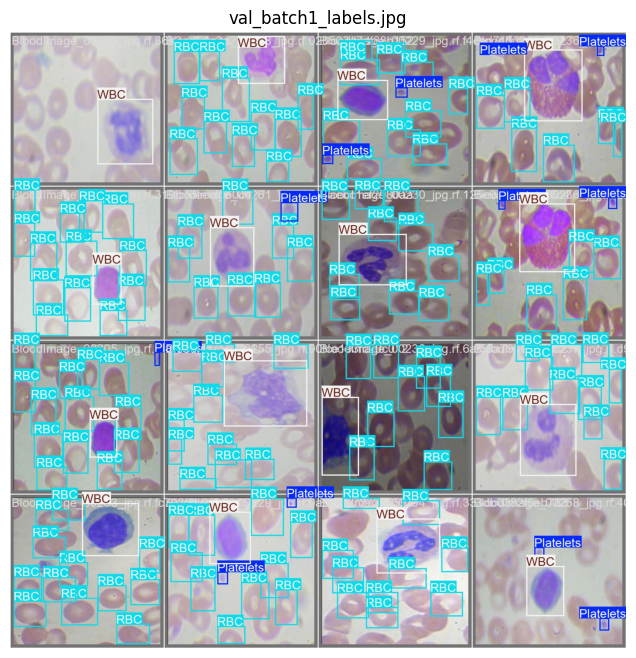

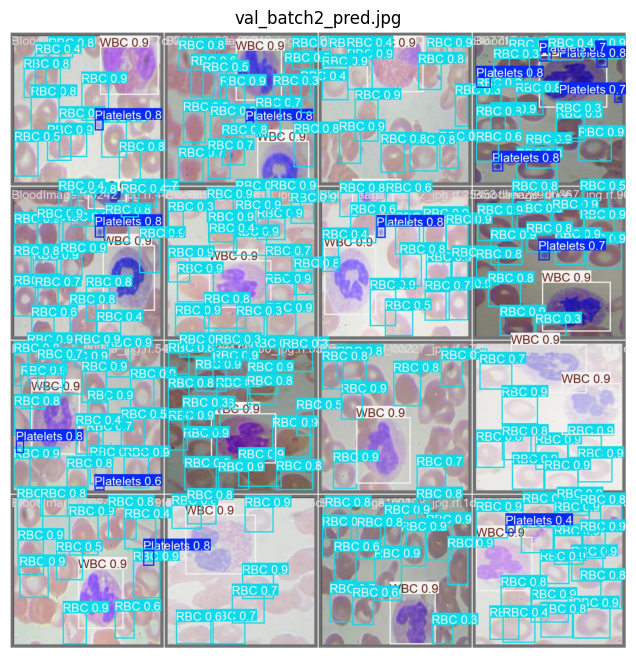

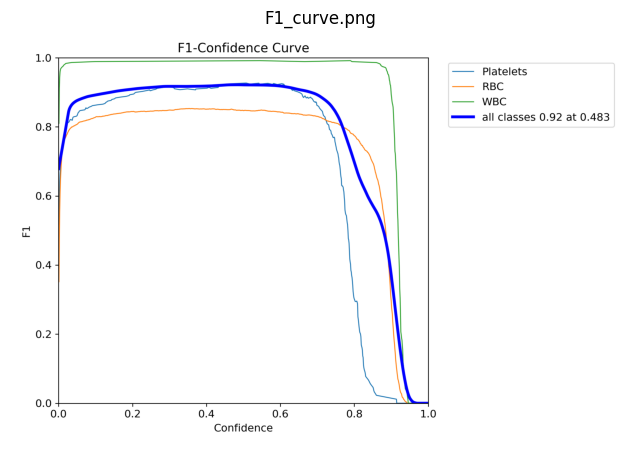

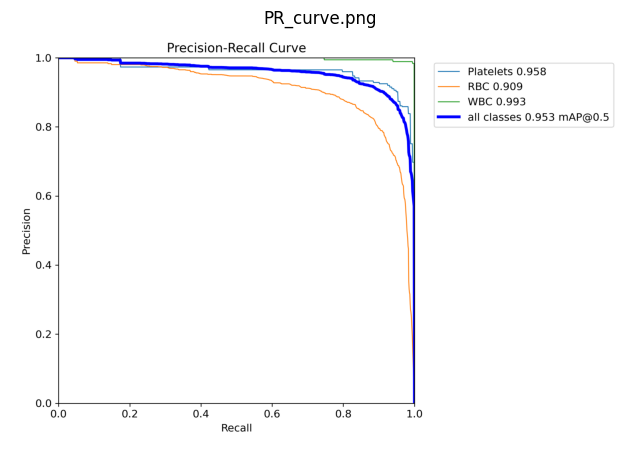

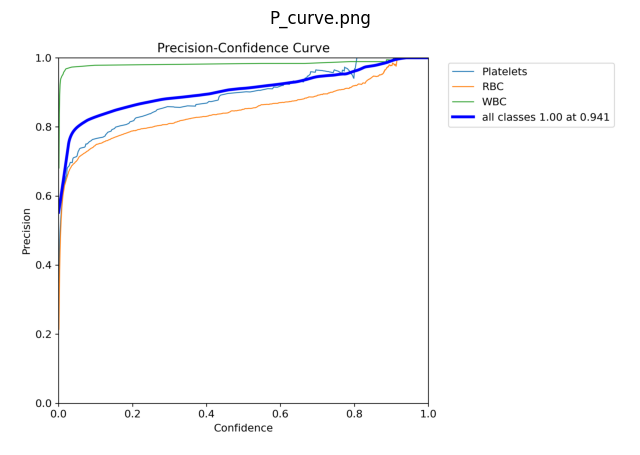

...

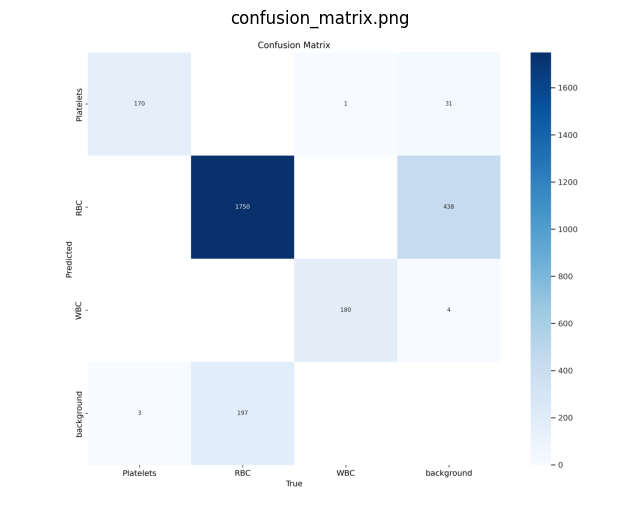

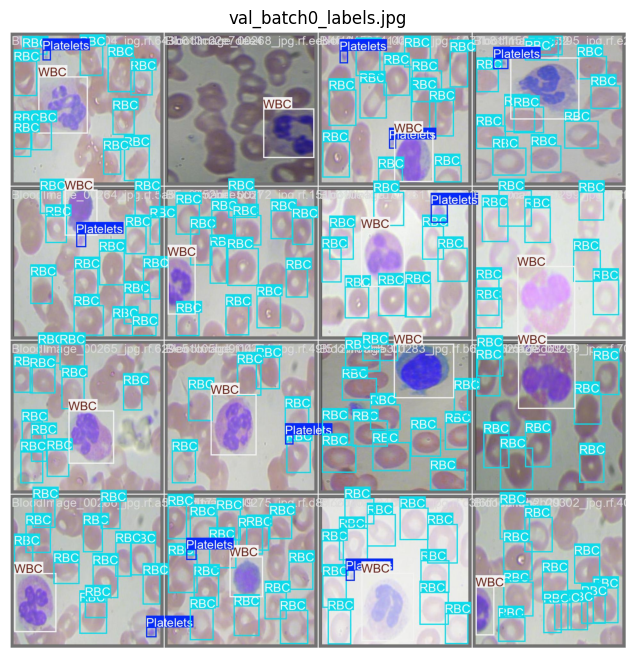

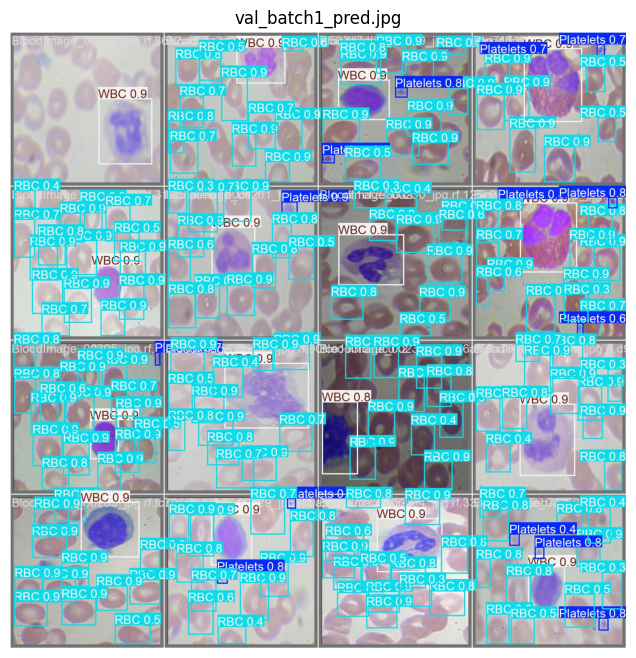

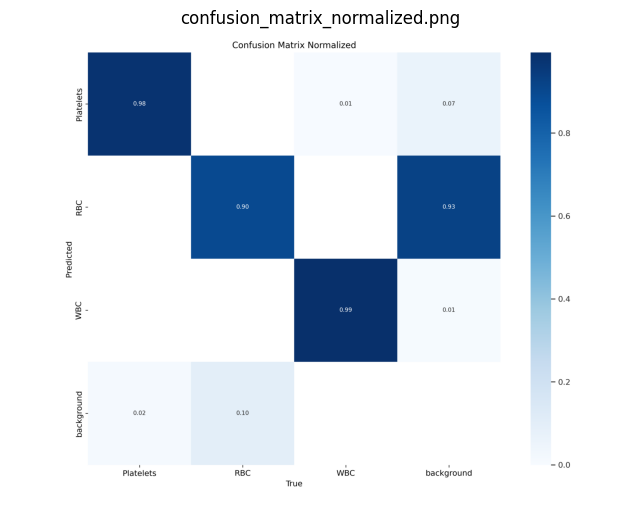

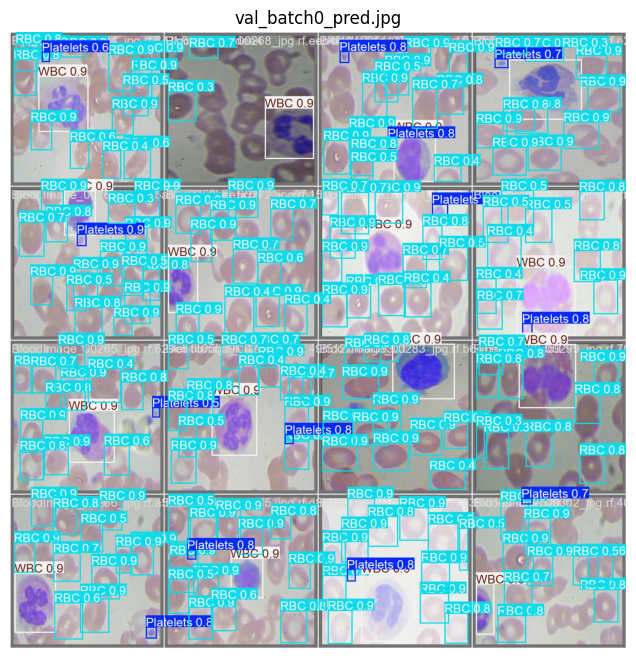

In [18]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Path to the directory containing the images
directory = detection_val.save_dir

# List all JPG and PNG files in the directory
image_files = [file for file in os.listdir(directory) if file.endswith(('.jpg', '.png'))]

# Check if there are any image files
if not image_files:
    print("No JPG or PNG files found in the directory.")
else:
    # Plot each image separately
    for file in image_files:
        # Open the image file
        img_path = os.path.join(directory, file)
        img = Image.open(img_path)

        # Display the image
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.title(file)
        plt.axis('off')
        plt.show()


## 6. Inference ([Prediction](https://docs.ultralytics.com/modes/predict/))

The process of making sense out of visual data is called 'inference' or 'prediction'. Ultralytics YOLOv8 offers a powerful feature known as predict mode that is tailored for high-performance, real-time inference on a wide range of data sources.

---
**Inference**

---


0: 640x640 23 RBCs, 1 WBC, 16.3ms
1: 640x640 1 Platelets, 20 RBCs, 1 WBC, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


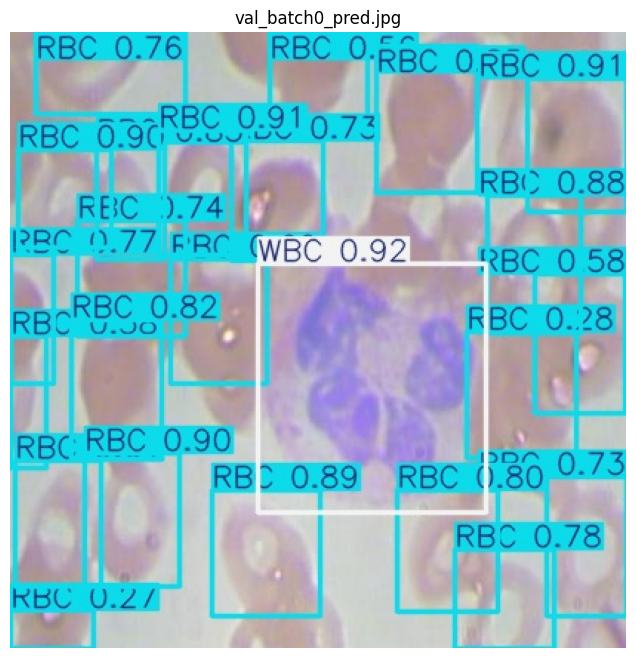

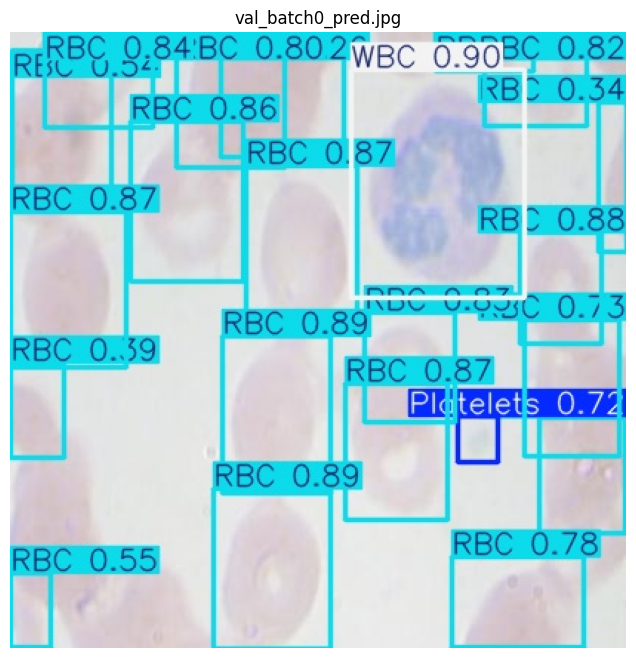

In [22]:
# Run batched inference on a list of images
results = model(["/content/YOLO-1/test/images/BloodImage_00000_jpg.rf.5fb00ac1228969a39cee7cd6678ee704.jpg", "/content/YOLO-1/test/images/BloodImage_00023_jpg.rf.0438812a636b3cbe583ddb254ef6f844.jpg"])  # return a list of Results objects


---
**Display Results of prediction**

---

In [ ]:

# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen
    result.save(filename="result.jpg")  # save to disk
    img = Image.open("result.jpg")

    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(file)
    plt.axis('off')
    plt.show()

or another way to display the results of inference.


0: 640x640 23 RBCs, 1 WBC, 6.3ms
1: 640x640 1 Platelets, 20 RBCs, 1 WBC, 6.3ms
Speed: 3.1ms preprocess, 6.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


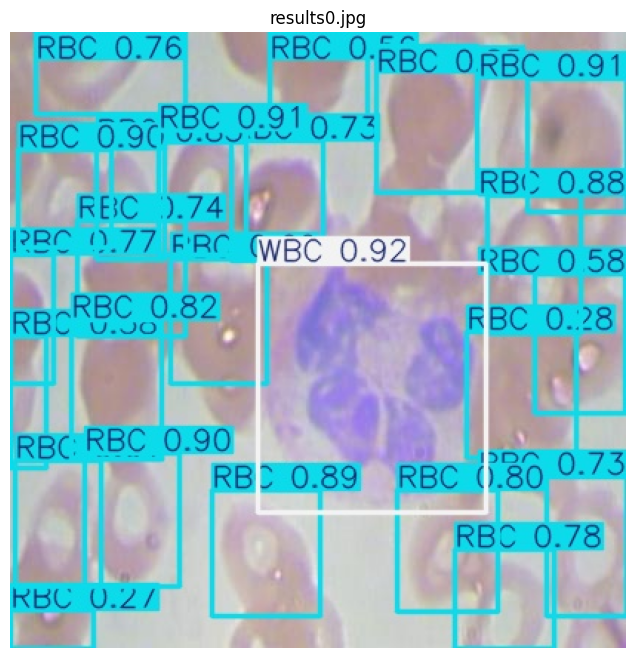

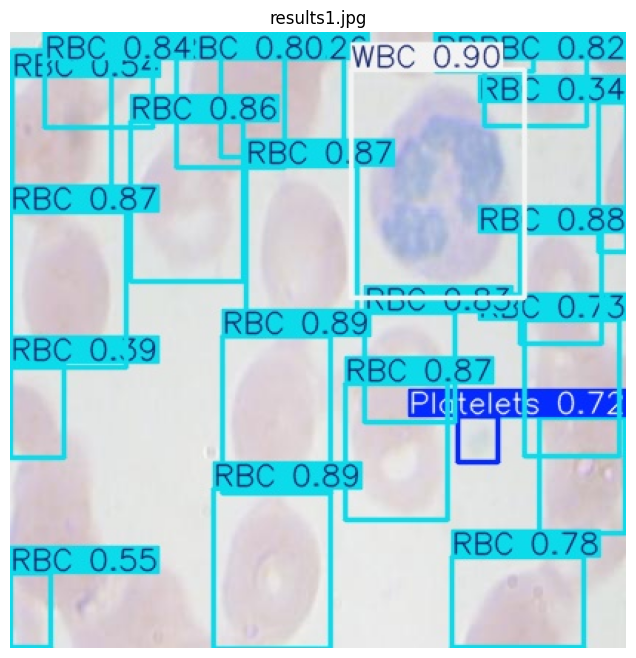

In [24]:
from PIL import Image


# Run batched inference on a list of images
results = model(["/content/YOLO-1/test/images/BloodImage_00000_jpg.rf.5fb00ac1228969a39cee7cd6678ee704.jpg", "/content/YOLO-1/test/images/BloodImage_00023_jpg.rf.0438812a636b3cbe583ddb254ef6f844.jpg"])  # return a list of Results objects

# Process results list

# Visualize the results
for i, r in enumerate(results):
    # Plot results image
    im_bgr = r.plot()  # BGR-order numpy array
    im_rgb = Image.fromarray(im_bgr[..., ::-1])  # RGB-order PIL image

    # Show results to screen (in supported environments)
    r.show()

    # Save results to disk
    r.save(filename=f"results{i}.jpg")

    img = Image.open(f"results{i}.jpg")

    # Display the image
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f"results{i}.jpg")
    plt.axis('off')
    plt.show()

